In [5]:
import numpy as np
import numba

import matplotlib.pyplot as plt
import matplotlib as mpl
from matplotlib.offsetbox import OffsetImage, AnnotationBbox

from sklearn.metrics import pairwise_distances
from tensorflow.keras.applications import VGG16
from tensorflow.keras import Model

from openTSNE import TSNE
from openTSNE.sklearn import TSNE as sklTSNE
from openTSNE.callbacks import ErrorLogger

from VisionEngine.datasets import guppies
from VisionEngine.utils.config import process_config
from VisionEngine.utils import factory
import sys

import tensorflow as tf

In [7]:
pwd

'/tmp/96702c76-5000-4dd0-9e3b-82d80713a652'

In [6]:
config_file = '../VisionEngine/configs/guppy_vae_config.json'
config = process_config(config_file)

FileNotFoundError: [Errno 2] No such file or directory: '../VisionEngine/configs/guppy_vae_config.json'

In [3]:
data_loader = factory.create(
            "VisionEngine.data_loaders."+config.data_loader.name
            )(config)

model = factory.create(
            "VisionEngine.models."+config.model.name
            )(config)

checkpoint_path = '/home/etheredge/Workspace/VisionEngine/models/checkpoints/guppy_vae/2020-056-23/guppy_vae-281-721.69.hdf5'

model.load(checkpoint_path)

importing VisionEngine.data_loaders.guppy_vae_data_loader
getattr GuppyDataLoader
importing VisionEngine.models.vae_model
getattr VAEModel


In [2]:
import tensorflow as tf
from tensorflow.keras.layers import Flatten
import math
def sample_likelihood(x, x_hat):
    mse = - tf.losses.mean_squared_error(Flatten()(x), Flatten()(x_hat))
    return tf.math.log(1./(tf.sqrt(2.*math.pi))*tf.exp(-.5*(mse)**2.))

def embed_images(x):
    x = model.model.get_layer('encoder').predict(x, batch_size=10)
    return [model.model.get_layer('normal_variational')(x[0]), 
            model.model.get_layer('normal_variational_1')(x[1]),
            model.model.get_layer('normal_variational_2')(x[2]),
            model.model.get_layer('normal_variational_3')(x[3])]

def reconstruct_images(z):
    return model.model.get_layer('decoder').predict(z)

with tf.device("GPU:0"):
    z = embed_images(data_loader.get_test_data()[0])
    x_hat = reconstruct_images(z)
    likelihood = sample_likelihood(data_loader.get_test_data()[0], x_hat)

NameError: name 'data_loader' is not defined

In [2]:
def imscatter(x, y, image, ax=None, zoom=1):
    if ax is None:
        ax = plt.gca();
    try:
        image = plt.imread(image);
    except TypeError:
        # Likely already an array...
        pass
    x, y = np.atleast_1d(x, y);
    artists = [];
    for i, (x0, y0) in enumerate(zip(x, y)):
        im = OffsetImage(image[i], zoom=zoom);
        ab = AnnotationBbox(im, (x0, y0), xycoords='data', frameon=False);
        artists.append(ax.add_artist(ab));
    ax.update_datalim(np.column_stack([x, y]));
    ax.autoscale();
    ax.grid(False);
    return artists

In [51]:
def make_perceptual_loss_model(input_shape, layers=[2, 5, 9, 13]):
    loss_model = VGG16(
        weights='imagenet',
        include_top=False,
        input_shape=input_shape)
    loss_model.trainable = False
    for layer in loss_model.layers:
        layer.trainable = False
    loss_layers = [
                loss_model.layers[i].output
                for i in layers
                ]
    return Model(loss_model.inputs, loss_layers)

@numba.jit(nopython=True, parallel=True)
def calculate_perceptual_distances(X):
    dists = np.zeros((989,989))
    for layer in X:
        layer.shape
        for i in range(layer.shape[0]):
            for j in range(layer.shape[0]):
                shape = (layer[i].shape[0]*layer[i].shape[1]*layer[i].shape[2])
                sqr = np.square(layer[i] - layer[j])
                sm = np.sum(sqr)
                val = sm / shape
                dists[i,j] =+ val
    return dists


In [68]:
z_4 = np.load('../data/processed/z_4_guppies_samples_SuppFig1a_SuppFig1b.npy')
z_3 = np.load('../data/processed/z_3_guppies_samples_SuppFig1a_SuppFig1b.npy')
z_2 = np.load('../data/processed/z_2_guppies_samples_SuppFig1a_SuppFig1b.npy')
z_1 = np.load('../data/processed/z_1_guppies_samples_SuppFig1a_SuppFig1b.npy')
Z = np.concatenate([z_1, z_2, z_3, z_4],axis=1)

In [60]:
# perceptual_model = make_perceptual_loss_model((256,256,3))
# perception = perceptual_model.predict(images)
perceptual_distances = calculate_perceptual_distances(perception)

In [62]:
from sklearn.manifold import TSNE as sklTSNE

In [67]:
# raw_image_embedding = TSNE(callbacks=ErrorLogger(), n_jobs=-1, learning_rate=images.shape[0]/12).fit(images.reshape(989,256*256*3))
perceptual_embedding = sklTSNE(n_jobs=-1, learning_rate=images.shape[0]/12, metric='precomputed').fit_transform(perceptual_distances)
raw_image_embedding = sklTSNE(n_jobs=-1, learning_rate=images.shape[0]/12).fit_transform(images.reshape(989,256*256*3))



In [69]:
our_embedding = sklTSNE(n_jobs=-1, learning_rate=images.shape[0]/12).fit_transform(Z)

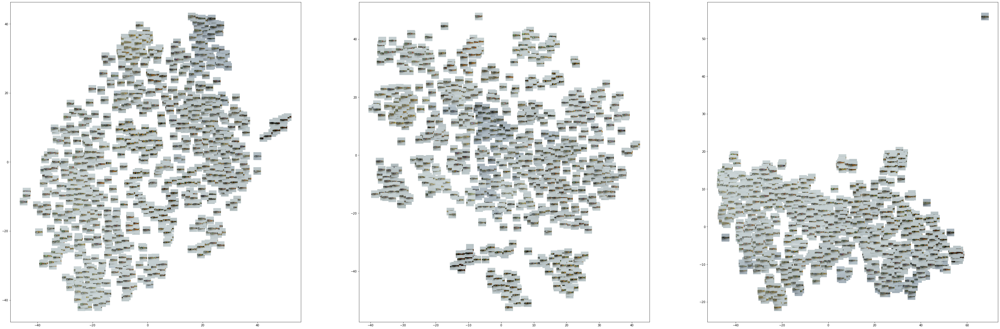

In [71]:
embedding = perceptual_embedding
plt.figure(figsize=(60,20))
plt.subplot(131)
embedding = raw_image_embedding
imscatter(embedding[:, 0], embedding[:, 1], images, zoom=0.1);
plt.subplot(132)
embedding = perceptual_embedding
imscatter(embedding[:, 0], embedding[:, 1], images, zoom=0.1);
plt.subplot(133)
embedding = our_embedding
imscatter(embedding[:, 0], embedding[:, 1], images, zoom=0.1);


In [ ]:
perceptual_embedding = perceptual_embedding.transform(perceptual_distances)

In [ ]:
plt.subplot(131)
imscatter(embedding[:, 0], embedding[:, 1], real_images, zoom=0.1);

plt.subplot(132)
Y = np.array(real_labels)
classnames, indices = np.unique(Y, return_inverse=True)
N = len(classnames)
cmap = plt.cm.rainbow
bounds = np.linspace(0,N,N+1)
norm = mpl.colors.BoundaryNorm(bounds, cmap.N)
plt.scatter(embedding[:, 0], embedding[:, 1], alpha=0.5,
        c=indices, cmap=cmap, norm=norm, s=150)
plt.subplot(133)
L = np.load('samplelikelihoods.npy')
plt.scatter(embedding[:, 0], embedding[:, 1], alpha=0.5,
        c=L, vmax=np.percentile(L,95), vmin=np.percentile(L,5), cmap='viridis', s=150)
fig = plt.gcf()
fig.savefig('real_samples.pdf')

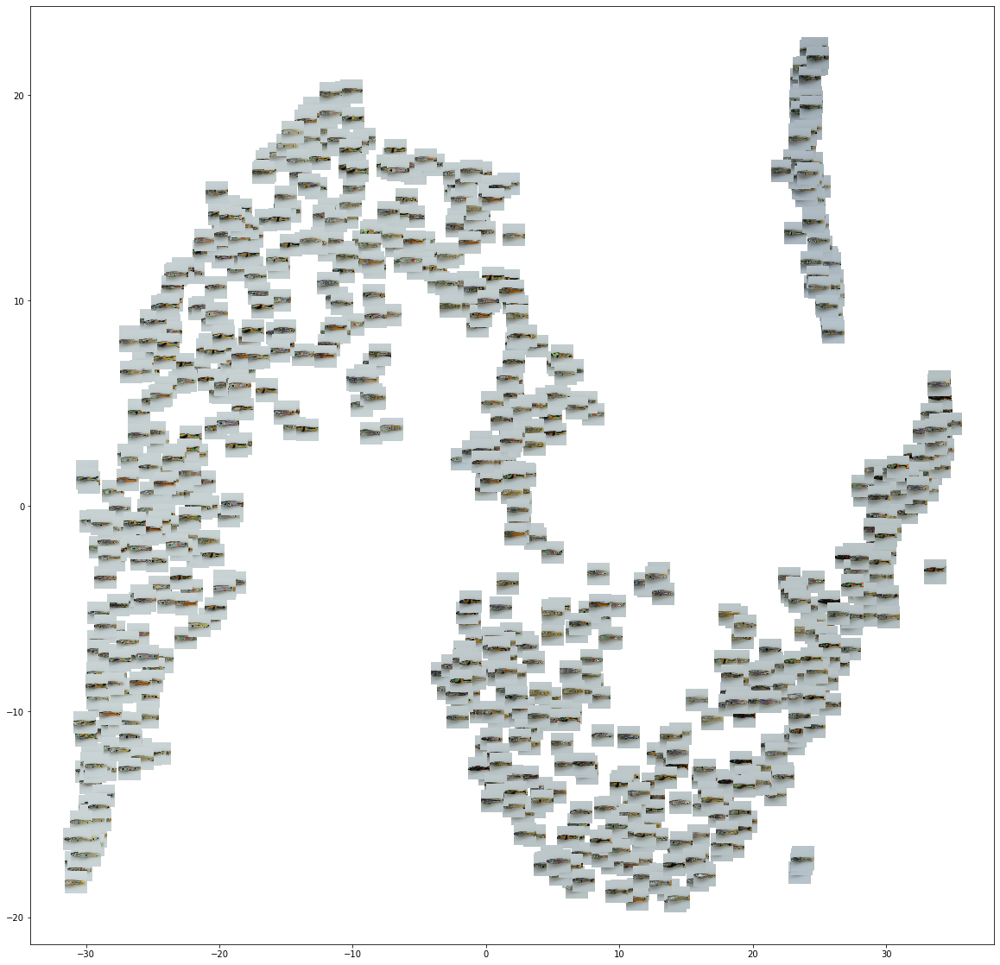

In [7]:
embedding = raw_image_embedding
plt.figure(figsize=(80,20))
imscatter(embedding[:, 0], embedding[:, 1], images, zoom=0.1)

In [8]:
# load the embeddings from our heirarchal variational model
z_4 = np.load('../data/processed/z_4_guppies_samples_SuppFig1a_SuppFig1b.npy')
z_3 = np.load('../data/processed/z_3_guppies_samples_SuppFig1a_SuppFig1b.npy')
z_2 = np.load('../data/processed/z_2_guppies_samples_SuppFig1a_SuppFig1b.npy')
z_1 = np.load('../data/processed/z_1_guppies_samples_SuppFig1a_SuppFig1b.npy')
Z = np.concatenate([z_1, z_2, z_3, z_4],axis=1)

In [ ]:
latent_embedding = TSNE(callbacks=ErrorLogger(), n_jobs=-1, learning_rate=images.shape[0]/12).fit(images.reshape(989,256*256*3))

In [30]:
from scipy.ndimage.measurements import histogram

In [47]:
histos = np.apply_along_axis(images, histogram, axes=(0,3))

TypeError: _apply_along_axis_dispatcher() missing 1 required positional argument: 'arr'

(array([5., 3., 1., 0., 0., 0., 0., 0., 0., 1.]),
 array([1.00000e+00, 1.10602e+04, 2.21194e+04, 3.31786e+04, 4.42378e+04,
        5.52970e+04, 6.63562e+04, 7.74154e+04, 8.84746e+04, 9.95338e+04,
        1.10593e+05]),
 <a list of 10 Patch objects>)

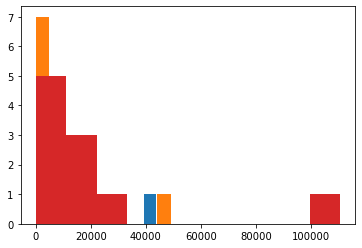

In [40]:
hist = histogram(images[0][:,:,0], 0, 1, 10)
plt.hist(hist)
hist = histogram(images[0][:,:,1], 0, 1, 10)
plt.hist(hist)
hist = histogram(images[0][:,:,2], 0, 1, 10)
plt.hist(hist)
hist = histogram(images[0], 0, 1, 10)
plt.hist(hist)

In [44]:
hist = nphistogram(images[:,:,:,0],0,1,10)

In [45]:
hist.shape

(10,)